# Pipeline for Advanced Lane Regression (PipeAdLR)

## Identifying Lane Regions on a Road

***

_"I have a cunning plan."_

&ndash; Baldrick, _Black Adder_

The Pipeline for Advanced Lane Regression (PipeAdLR) implements a solution to the scenario described in Project 4, a return to that of [Project 1](https://github.com/xperroni/CarND-LaneLines-P1) with additional considerations on camera geometry and color spaces.

## 1. Basic Setup

We start by defining some basic operations. In order to load calibration and test images from disk, we implement a function that takes a path expression as input and returns a list of paths to existing files that match the expression, and another that loads images from file:

In [1]:
from glob import glob


def find_images(path_expression):
    paths = glob(path_expression)
    paths.sort() # Sort paths lexicographically for more predictable results
    return paths


def load_image(path, size=None):
    image = cv2.imread(path)
    return image if size == None else cv2.resize(image, size)

It's often enlightening to see the results of operations an image processing system applies to its inputs. The class below makes it easy to display several images side by side or in a grid:

In [2]:
import matplotlib.pyplot as plt
%matplotlib inline


# Widen the page region used for plots
plt.rcParams['figure.figsize'] = (12.0, 4.0) # Otiginal: (6.0, 4.0)

class Displayer(object):
    def __init__(self, m, n):
        self.shape = (m, n)

    def __call__(self, i, j, image, colorspace='CV'):
        r'''Display an image of given colorspace.

            Possible values:

            * `CV` - Automatically selects `BGR` or `L` depending on the number of channels
            * `BGR` - OpenCV Blue, Green, Red (BGR) color image
            * `L` - grayscale image
            * `RGB` - Color image
        '''
        plotter = self.plotter(i, j)
        
        if type(image) == tuple:
            (X, Y) = image
            plotter.plot(X, Y, colorspace)
            return

        if colorspace == 'CV':
            channels = image.shape[2] if len(image.shape) > 2 else 1
            if channels == 1:
                return self(i, j, image, 'L')
            elif channels == 3:
                return self(i, j, image, 'BGR')
            else:
                raise Exception('Cannot display image with %d channels' % channels)
        
        if colorspace == 'BGR':
            plotter.imshow(image[:, :, ::-1])
        elif colorspace == 'L':
            plotter.matshow(image, cmap=plt.cm.gray)
        else: # colorspace == 'RGB'
            plotter.imshow(image)

    def __enter__(self):
        return self

    def __exit__(self, exc_type, exc_value, traceback):
        plt.show()
        
    def plotter(self, i, j):
        return plt.subplot2grid(self.shape, (i, j))
        
    
def display_1(image):
    r'''Convenience function for displaying a single image.
    '''
    with Displayer(1, 1) as display:
        display(0, 0, image)

The functions below provide shortcuts to some important image processing operations:

In [3]:
import cv2
import numpy as np


# Basic colors in BGR format.
BGR_BLUE = (255, 0, 0)
BGR_GREEN = (0, 255, 0)
BGR_RED = (0, 0, 255)


def grayscale(bgr):
    r'''Converts the given BGR image to grayscale.
    '''
    return cv2.cvtColor(bgr, cv2.COLOR_BGR2GRAY)


def merge(image, markers):
    r'''Merge the given input and marker images.
    '''
    return cv2.addWeighted(markers, 1, image, 1, 0)


def draw_lines(bgr, points, color, thickness=1):
    r'''Draws a sequence of connected lines.
    '''
    pixels = points.astype(np.int32)
    pixels.shape = (1, points.shape[0], 1, 2)
    
    cv2.polylines(bgr, pixels, False, color, thickness)


class Size(tuple):
    r'''Image dimensions in OpenCV style.
    '''
    def __new__(cls, image):
        return tuple.__new__(cls, image.shape[:2][::-1])
    
    @property
    def width(self):
        return self[0]
    
    @property
    def height(self):
        return self[1]

The algorithms we are going to implement require a lot of parameters to be set, and it's easy to lost track of how many there are or where they are used. To make the situation explicit, we define a global object to hold all system parameters:

In [4]:
class Trie(object):
    r'''Dynamic collection of named attributes.
    '''
    def __getattr__(self, name):
        value = Trie()
        object.__setattr__(self, name, value)
        return value


params = Trie()
params.chessboard.paths = find_images('camera_cal/calibration*.jpg') # Paths to chessboard reference images
params.chessboard.size = (9, 6) # Size of the chessboard, in horizontal and vertical internal corner counts
params.inputs.thresholds.hue = (0, 100) # Thresholds for hue-based feature selection
params.inputs.thresholds.lightness = (200, 255) # Thresholds for lightness-based feature selection
params.inputs.thresholds.saturation = (127, 255) # Thresholds for saturation-based feature selection
params.inputs.thresholds.sobel = (0.5, 1.0) # Thresholds for Sobel-based feature selection
params.perspectives.front.corners = (0.1, 0.6, 0.9, 1.0) # Front perspective quadrangle as image dimension fractions
params.perspectives.corrections.x = 0.15 # Correction offset for perspective transform
params.perspectives.topdown.window = (0.15, 0.2) # Dimensions (width, height) of point search window
params.world.scale = (3.7 / 700.0, 30.0 / 720.0) # Convertion factors from image pixels to meters in the real world
params.estimates.decay = 0.9 # Curve parameter estimate decay rate

## 2. Camera Calibration

The first step in our visual pipeline is to correct inputs for lens distortions. For that we need to compute image coordinates for the inner corners of a checkerboard pattern across several pictures, along with their corresponding pattern-centric 3D coordinates. This is accomplished by the code below:

In [5]:
from itertools import product


class Corners(object):
    def __init__(self, bgr):
        (w, h) = Size(bgr)
        (nx, ny) = params.chessboard.size
        self.imgpoints = []
        self.size = (0, 0)

        grays = grayscale(bgr)

        for (cy, cx) in product(range(ny, 2, -1), range(nx, 2, -1)):
            if cx * cy <= self.size[0] * self.size[1]:
                continue

            (found, corners) = cv2.findChessboardCorners(grays, (cx, cy), None)
            if found:
                self.imgpoints = corners
                self.size = (cx, cy)

        (ox, oy) = self.__offset(nx, ny, w, h)
        (sx, sy) = self.size
        rx = range(ox, ox + sx)
        ry = range(oy, oy + sy)

        self.objpoints = np.array([[[x, y, 0]] for (y, x) in product(ry, rx)], dtype=np.float32)
        self.offset = (ox, oy)

    def __len__(self):
        return len(self.imgpoints)
        
    def __offset(self, nx, ny, w, h):
        (cx, cy) = self.size
        
        ox = 1
        if cx < nx:
            # Check whether the leftmost or rightmost point is closer to the respective image border
            dl = np.min([p[0, 0] for p in self.imgpoints[::cx]])
            dr = w - np.max([p[0, 0] for p in self.imgpoints[(cx - 1)::cx]])
            if dr < dl:
                ox += nx - cx

        oy = 1
        if cy < ny:
            # Check whether the highest or lowest point is closer to the respective image border
            dt = np.min([p[0, 1] for p in self.imgpoints[:cx]])
            db = h - np.max([p[0, 1] for p in self.imgpoints[-cx:]])
            if db < dt:
                oy += ny - cy

        return (ox, oy)

The code below demonstrates the results of corner detection on a set of calibration images:

"camera_cal/calibration01.jpg" - corner count (9, 5), top-left corner at offset (1, 1)


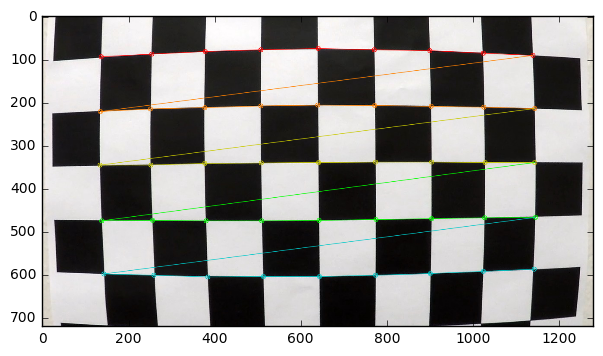

"camera_cal/calibration02.jpg" - corner count (9, 6), top-left corner at offset (1, 1)


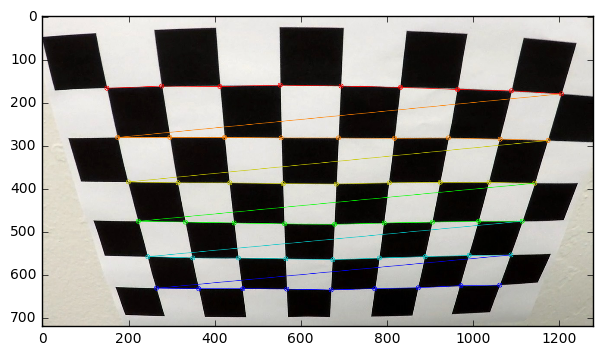

"camera_cal/calibration03.jpg" - corner count (9, 6), top-left corner at offset (1, 1)


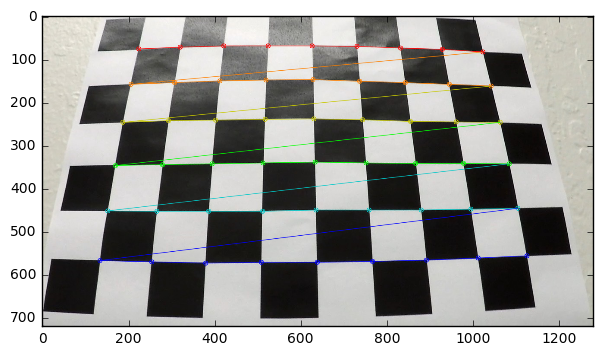

"camera_cal/calibration04.jpg" - corner count (5, 6), top-left corner at offset (1, 1)


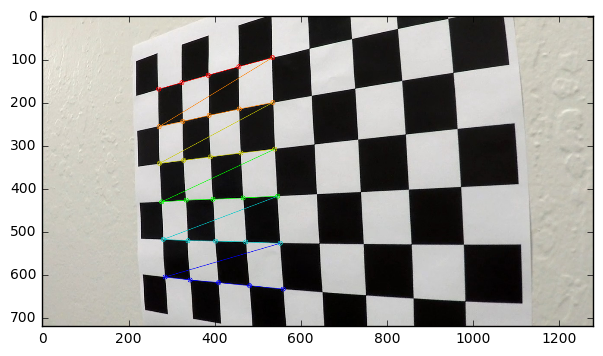

"camera_cal/calibration05.jpg" - corner count (7, 6), top-left corner at offset (3, 1)


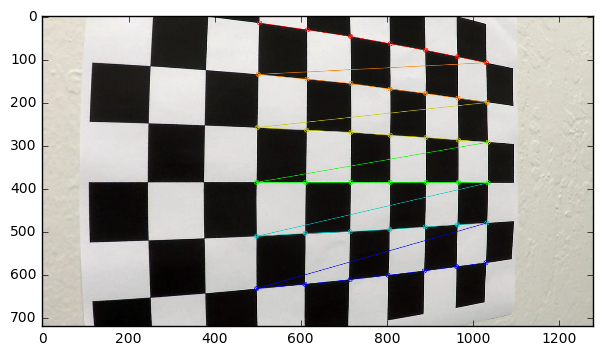

"camera_cal/calibration06.jpg" - corner count (9, 6), top-left corner at offset (1, 1)


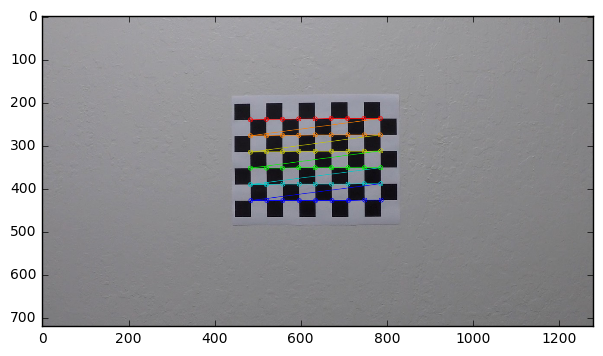

"camera_cal/calibration07.jpg" - corner count (9, 6), top-left corner at offset (1, 1)


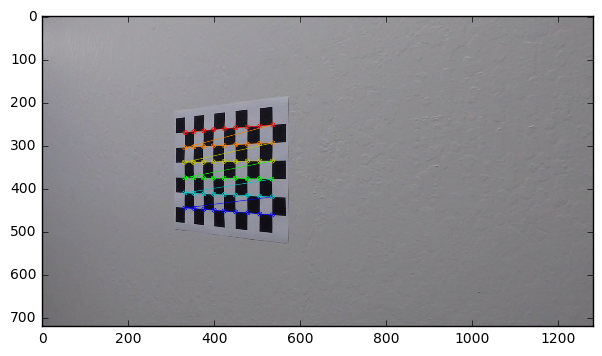

"camera_cal/calibration08.jpg" - corner count (9, 6), top-left corner at offset (1, 1)


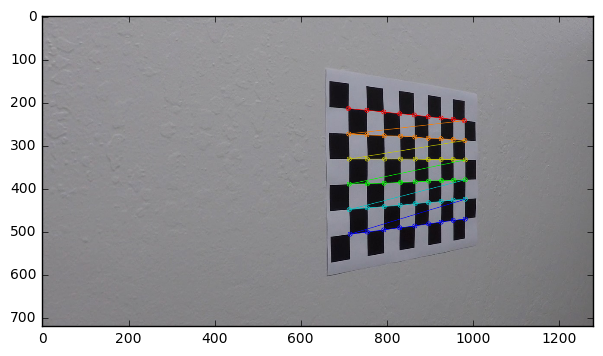

"camera_cal/calibration09.jpg" - corner count (9, 6), top-left corner at offset (1, 1)


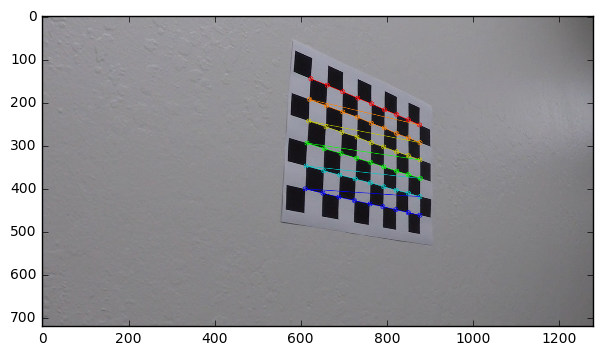

"camera_cal/calibration10.jpg" - corner count (9, 6), top-left corner at offset (1, 1)


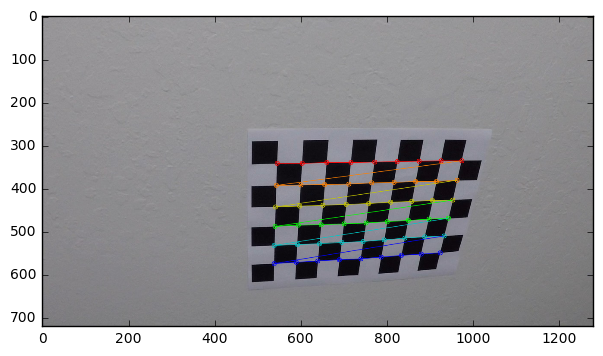

"camera_cal/calibration11.jpg" - corner count (9, 6), top-left corner at offset (1, 1)


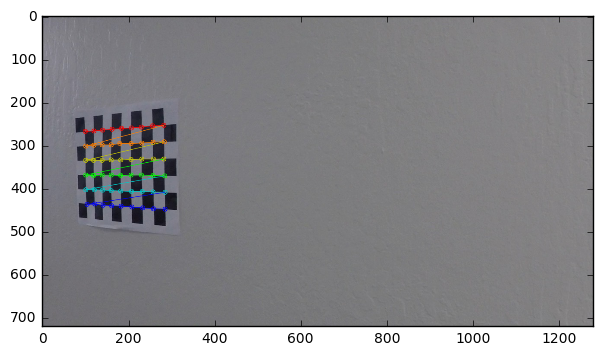

"camera_cal/calibration12.jpg" - corner count (9, 6), top-left corner at offset (1, 1)


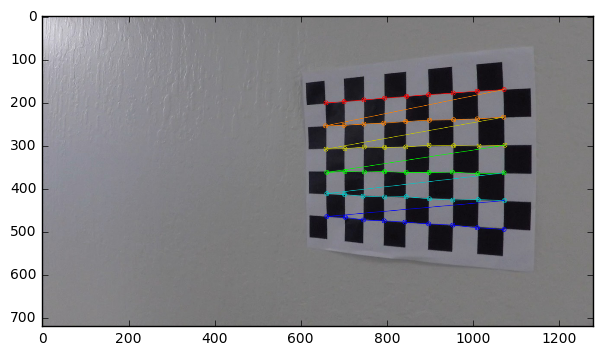

"camera_cal/calibration13.jpg" - corner count (9, 6), top-left corner at offset (1, 1)


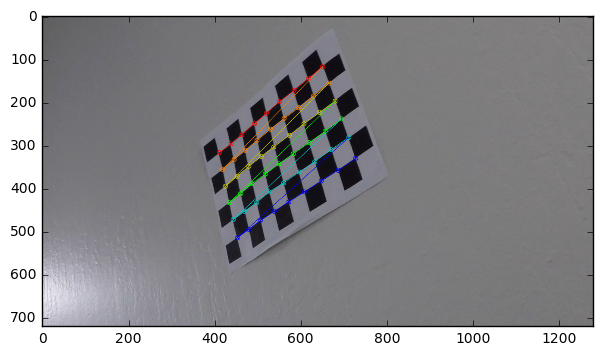

"camera_cal/calibration14.jpg" - corner count (9, 6), top-left corner at offset (1, 1)


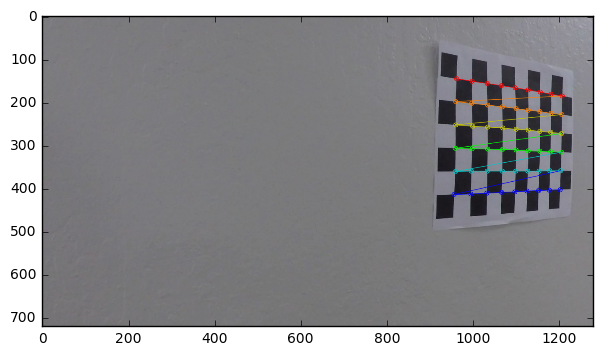

"camera_cal/calibration15.jpg" - corner count (9, 6), top-left corner at offset (1, 1)


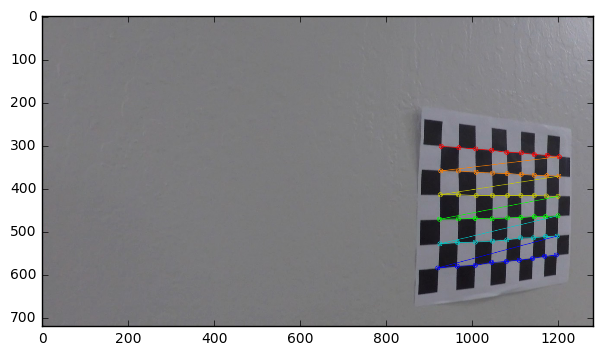

"camera_cal/calibration16.jpg" - corner count (9, 6), top-left corner at offset (1, 1)


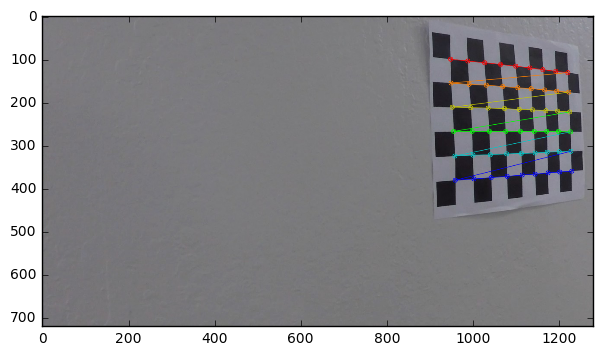

"camera_cal/calibration17.jpg" - corner count (9, 6), top-left corner at offset (1, 1)


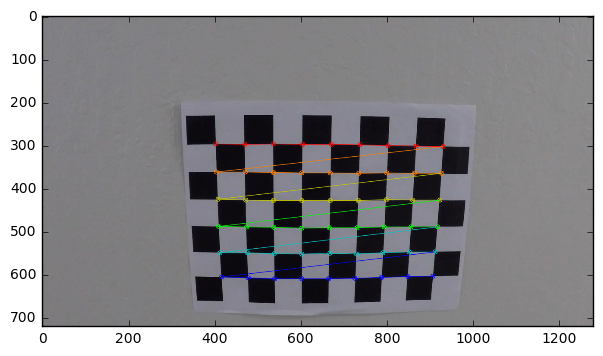

"camera_cal/calibration18.jpg" - corner count (9, 6), top-left corner at offset (1, 1)


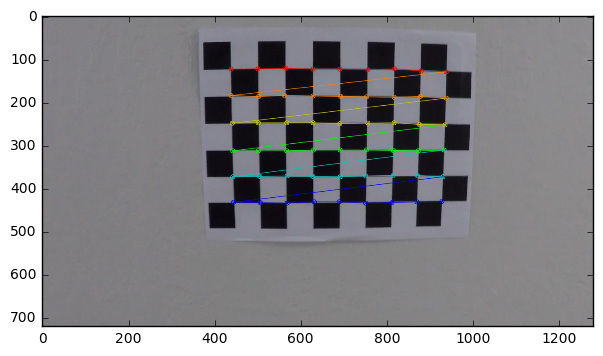

"camera_cal/calibration19.jpg" - corner count (9, 6), top-left corner at offset (1, 1)


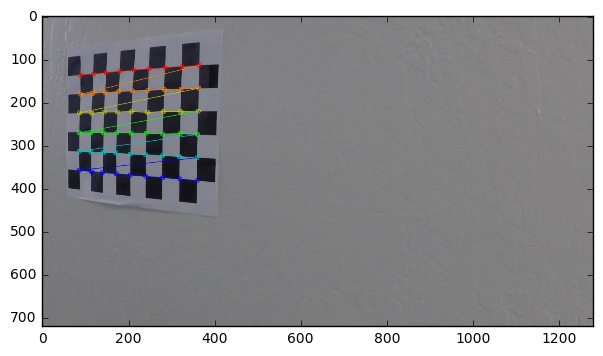

"camera_cal/calibration20.jpg" - corner count (9, 6), top-left corner at offset (1, 1)


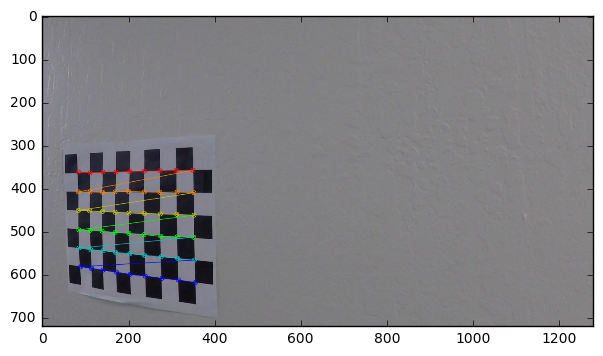

In [6]:
def display_corners():
    for path in params.chessboard.paths:
        bgr = load_image(path)
        corners = Corners(bgr)
        print('"%s" - corner count %s, top-left corner at offset %s' % (path, str(corners.size), str(corners.offset)))
        cv2.drawChessboardCorners(bgr, corners.size, corners.imgpoints, True)
        display_1(bgr)
        
        
display_corners()

---

With image and object coordinates of reference points found, we can now compute calibration parameters and define a distortion correction function:

In [7]:
def Undistorter():
    r'''Load a set of calibration images and compute camera parameters.
    
        Arguments:
        
        `path_expression`
            Search expression for calibration images.
            
        `nx`, `ny`
            Number of chessboard corners across horizontal and vertical directions, respectively.
    '''
    imgpoints = []
    objpoints = []
    for path in params.chessboard.paths:
        bgr = load_image(path)
        corners = Corners(bgr)
        if len(corners) != 0:
            imgpoints.append(corners.imgpoints)
            objpoints.append(corners.objpoints)
    
    (e, m, d, r, t) = cv2.calibrateCamera(np.array(objpoints), np.array(imgpoints), Size(bgr), None, None)
    return (lambda image: cv2.undistort(image, m, d))


# Instantiate distortion corrector on provided calibration images.
undistort = Undistorter()

The code below shows the effects of distortion correction on calibration test images:

test_images/solidWhiteRight.jpg


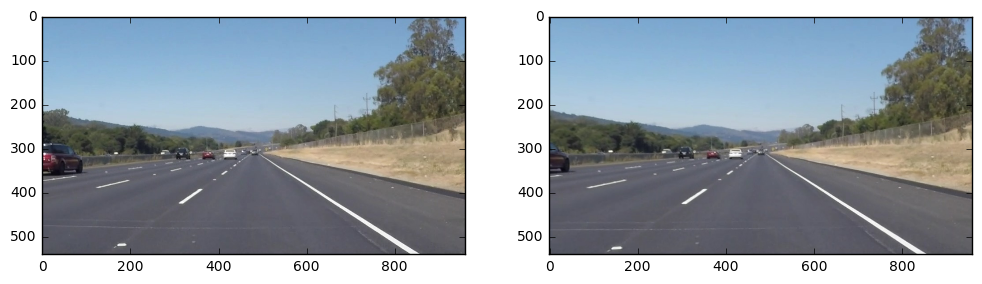

test_images/solidYellowLeft.jpg


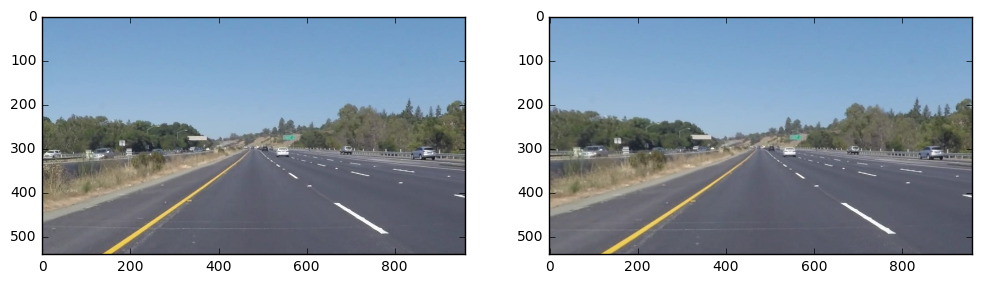

test_images/test1.jpg


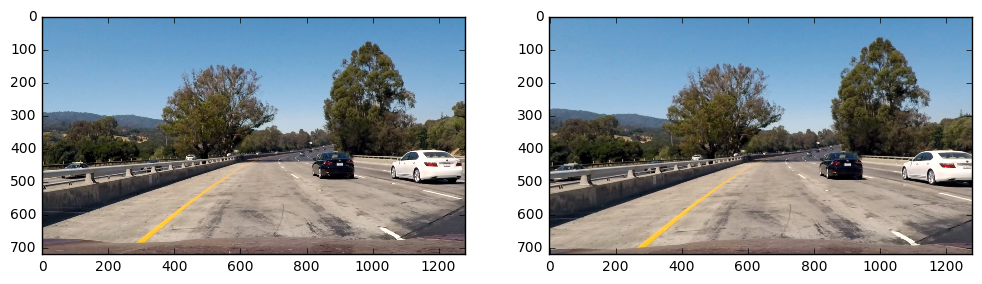

test_images/test2.jpg


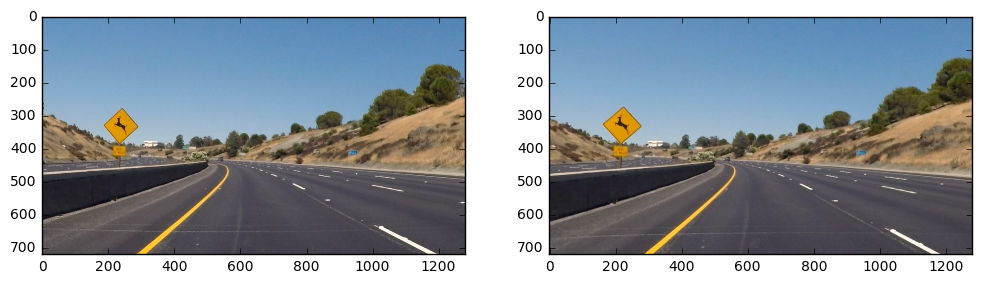

test_images/test3.jpg


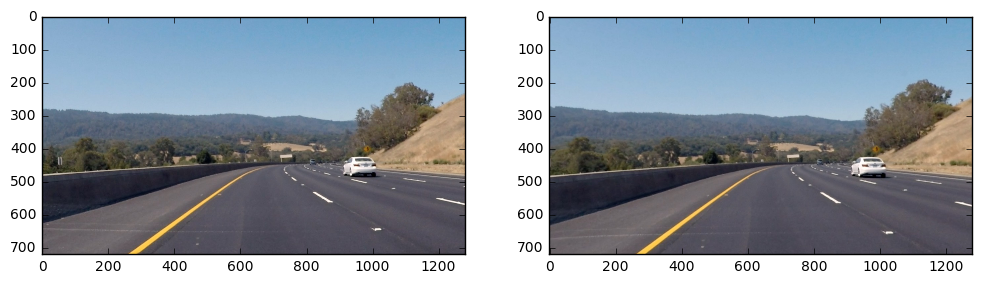

test_images/test4.jpg


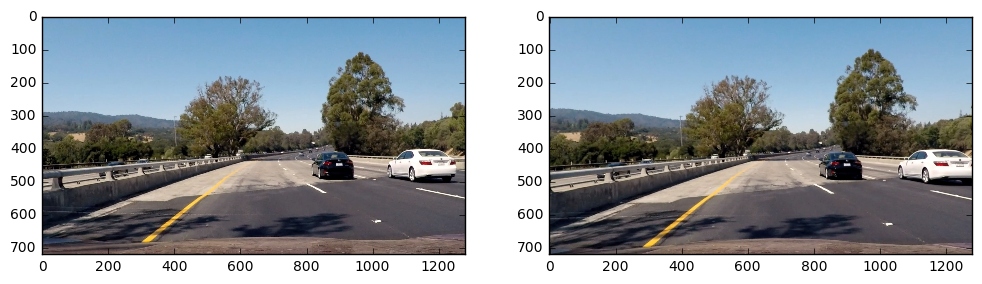

test_images/test5.jpg


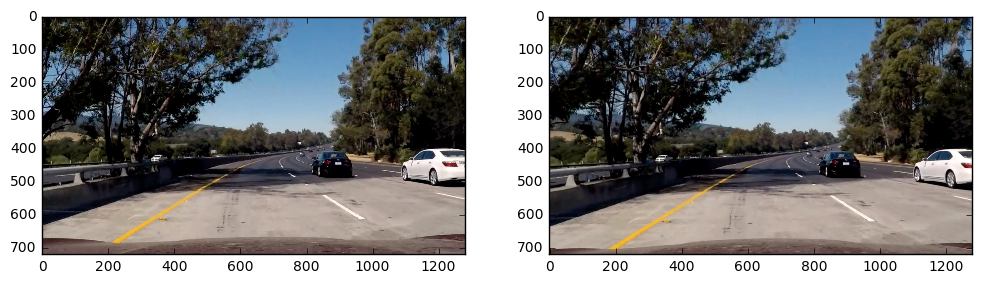

test_images/test6.jpg


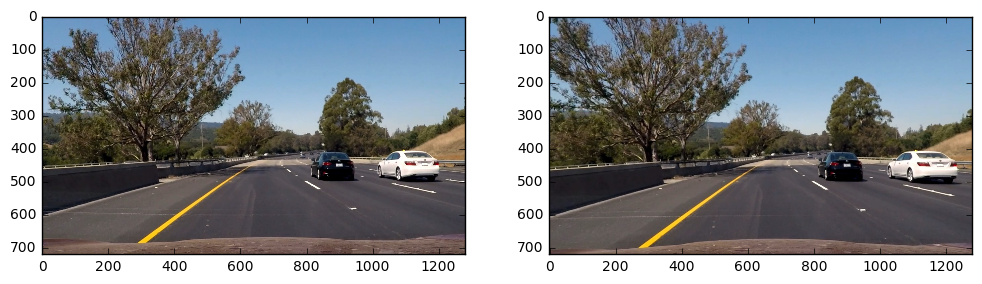

In [8]:
def display_test_images():
    for path in find_images('test_images/*.jpg'):
        print(path)
        image = load_image(path)
        with Displayer(1, 2) as display:
            display(0, 0, image)
            display(0, 1, undistort(image))


display_test_images()

---

## 3. Binary Map Generation

With input distortion accounted for, we proceed to implement a processing pipeline to extract lane line information from images. First, a sequence of image operations transforms color images into binary maps where set pixels very likely correlate to lane markings. These are pixels that in the original image possess one or more of the following properties:

* A high Sobel gradient across the horizontal direction;
* A high degree of Lightness (as defined for the HLS color space);
* A Hue close to yellow and a high degree of Saturation (again as defined for the HLS color space).

The function below can be used to display a hue map for the HLS color space, making possible to select hue thresholds:

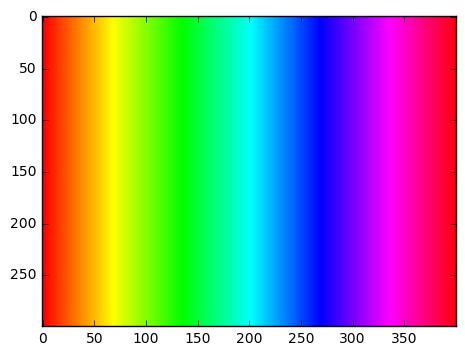

In [9]:
def display_hues():
    hls = np.zeros((3, 180, 3), dtype=np.uint8)
    for j in range(180):
        hls[:, j] = [j, 127, 255]
        
    bgr = cv2.cvtColor(hls, cv2.COLOR_HLS2BGR)
    resized = cv2.resize(bgr, (400, 300), interpolation=cv2.INTER_NEAREST)
    with Displayer(1, 1) as display:
        display(0, 0, resized)


display_hues()

The functions below implement the binary map outlined above:

In [10]:
def filter_hls(bgr):
    hls = cv2.cvtColor(bgr, cv2.COLOR_BGR2HLS)
    H = hls[..., 0]
    L = hls[..., 1]
    S = hls[..., 2]

    (La, Lb) = params.inputs.thresholds.lightness
    Lt = (La <= L) & (L <= Lb)
    
    (Ha, Hb) = params.inputs.thresholds.hue
    Ht = (Ha <= H) & (H <= Hb)
    
    (Sa, Sb) = params.inputs.thresholds.saturation
    St = (Sa <= S) & (S <= Sb)

    return (Ht & St) | Lt


def filter_sobel(bgr):
    grays = grayscale(bgr)
    S = cv2.Sobel(grays, cv2.CV_64F, 1, 0)
    S = np.abs(S)
    S -= np.min(S)
    S /= np.max(S)
    
    (a, b) = params.inputs.thresholds.sobel
    return (a <= S) & (S <= b)


def binary_map(bgr):
    out = undistort(bgr)
    out = filter_hls(out) | filter_sobel(out)
    return out.astype(np.uint8)

The code below shows the results of converting sample images to binary maps:

test_images/solidWhiteRight.jpg


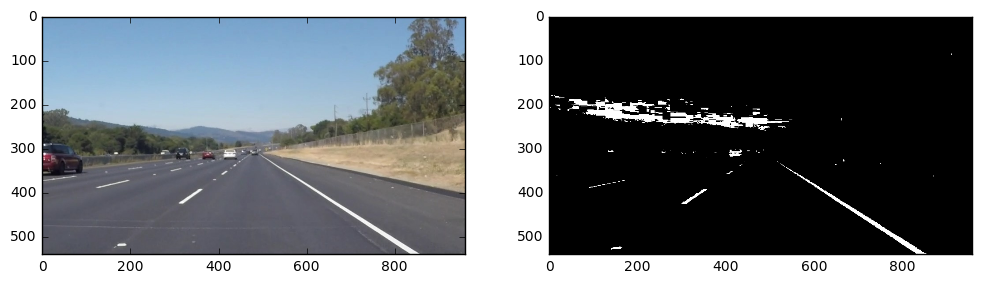

test_images/solidYellowLeft.jpg


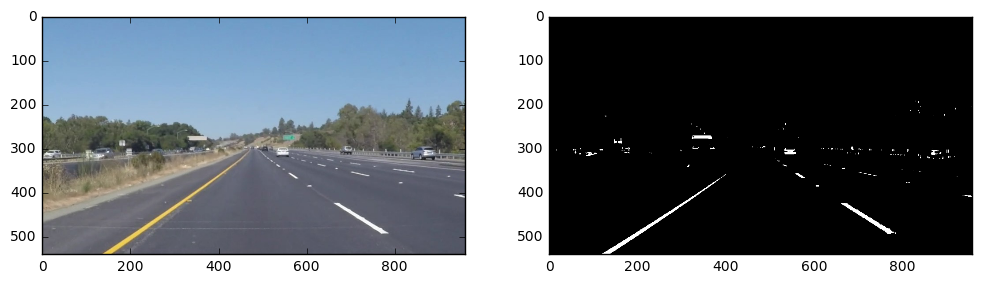

test_images/test1.jpg


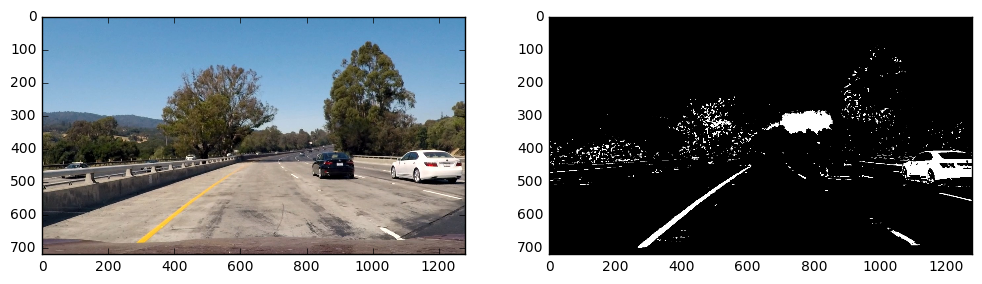

test_images/test2.jpg


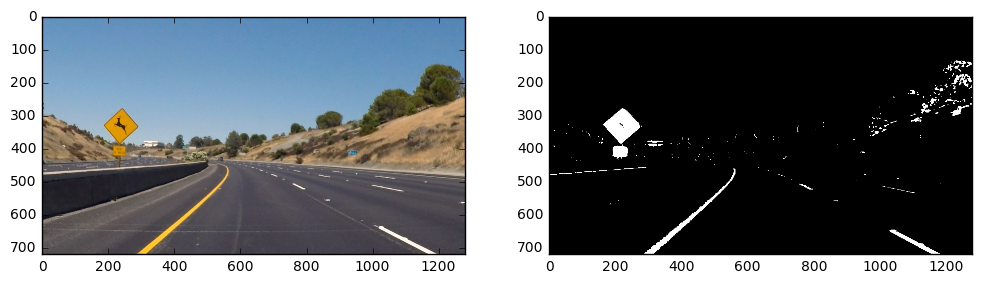

test_images/test3.jpg


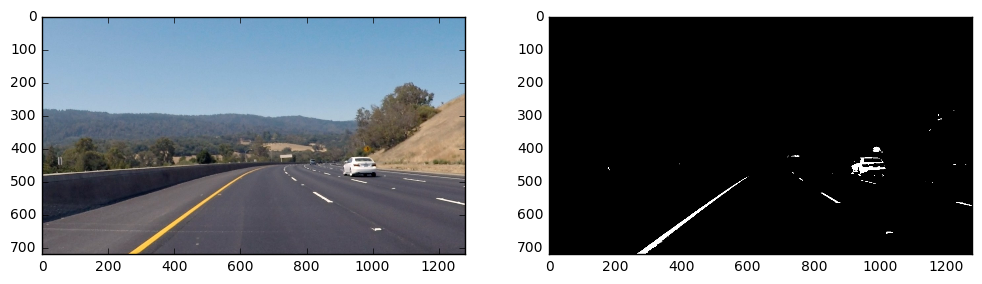

test_images/test4.jpg


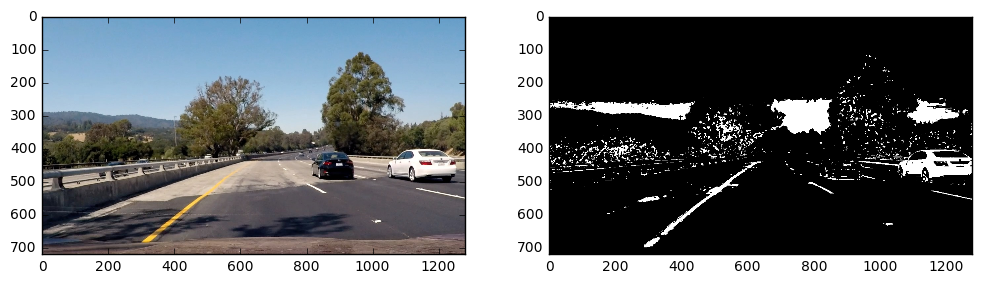

test_images/test5.jpg


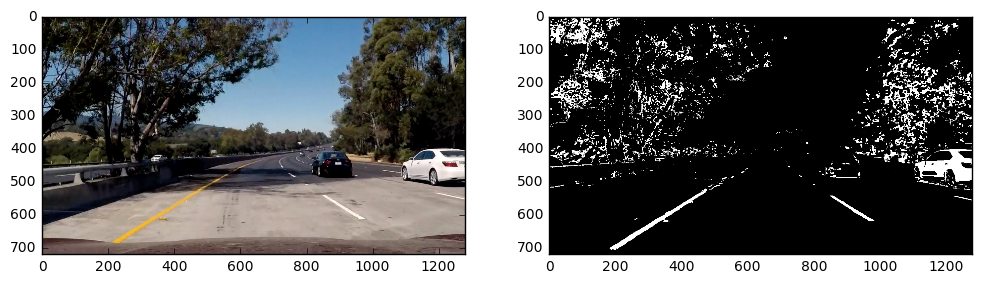

test_images/test6.jpg


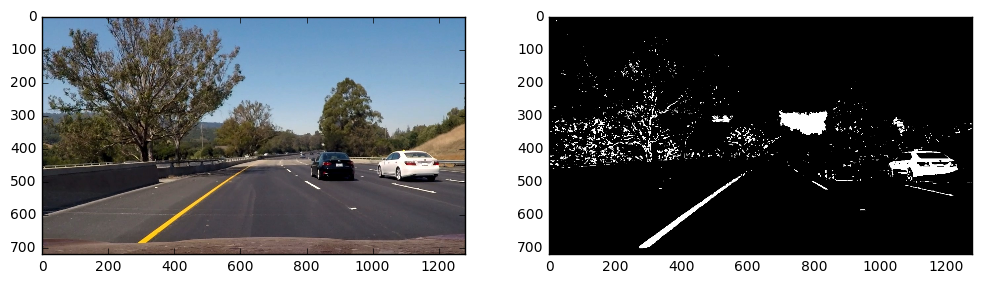

In [11]:
def binary_image(bgr):
    c = binary_map(bgr) * 255
    return np.dstack([c, c, c])


def display_binary_maps():
    for path in find_images('test_images/*.jpg'):
        print(path)
        image = load_image(path)
        with Displayer(1, 2) as display:
            display(0, 0, image)
            display(0, 1, binary_image(image))


display_binary_maps()

---

## 4. Perspective Transform

Binary maps must next be converted from front to top-down perspective for lane curve estimation. This is accomplished in two steps – first the perspective transform is computed, then applied to the map:

In [12]:
def perspective_corners(size):
    (w, h) = size
    
    # Front perspective quadrangle:
    # w_t - horizontal distance between top corners
    # h_t - vertical distance from top corners to image top
    # w_b - horizontal distance between bottom corners
    # h_b - vertical distance from bottom corners to image bottom
    # All values given as fractions of image width / height as appropriate.
    (w_t, h_t, w_b, h_b) = params.perspectives.front.corners

    # Horizontal coordinates for top-left and top-right corners
    w_tp = int(w * w_t)
    x_tl = (w - w_tp) // 2
    x_tr = x_tl + w_tp

    # Horizontal coordinates for bottom-left and bottom-right corners
    w_bp = int(w * w_b)
    x_bl = (w - w_bp) // 2
    x_br = x_bl + w_bp
    
    # Vertical coordinates for top and bottom corners
    y_t = int(h * h_t)
    y_b = int(h * h_b)
    
    # Front perspective quadrangle corners, in image scale
    bl = (x_bl, y_b) # Bottom left
    tl = (x_tl, y_t) # Top left
    tr = (x_tr, y_t) # Top right
    br = (x_br, y_b) # Bottom right
    
    front = np.float32([tr, br, bl, tl])

    # Top perspective quadrangle coordinates
    (x_l, x_r) = (0, w - 1)
    (y_t, y_b) = (0, h - 1)

    # Horizontal offset used to force a visually correct perspective transform.
    x_o = w * params.perspectives.corrections.x

    topdown = np.float32([
        (x_r, y_t),
        (x_r - x_o, y_b),
        (x_l + x_o, y_b),
        (x_l, y_t)
    ])
    
    return (front, topdown)


def perspective_matrices(size):
    r'''Computes a pair of transforms between front and top-down perspectives.
    '''
    (front, topdown) = perspective_corners(size)
    Mf = cv2.getPerspectiveTransform(front, topdown)
    Mi = cv2.getPerspectiveTransform(topdown, front)
    return (Mf, Mi)


def transform_image(data, M):
    return cv2.warpPerspective(data, M, Size(data), flags=cv2.INTER_LINEAR)


def transform_points(points, M):
    (m, n) = points.shape
    points = points.astype(np.float32)
    points.shape = (m, 1, n)
    return cv2.perspectiveTransform(points, M)

The code below shows the results of applying the perspective transform to binary maps:

test_images/solidWhiteRight.jpg


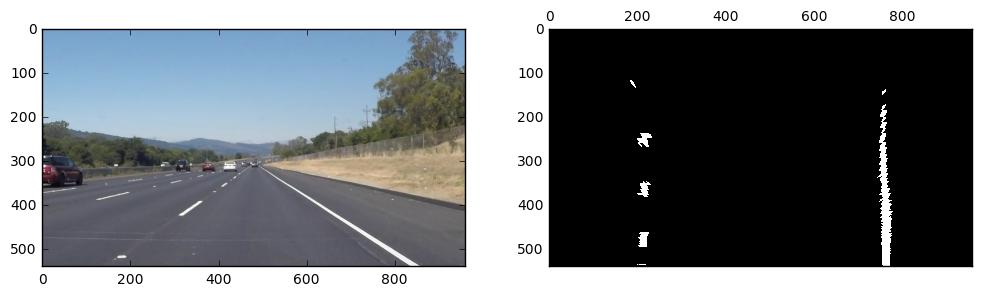

test_images/solidYellowLeft.jpg


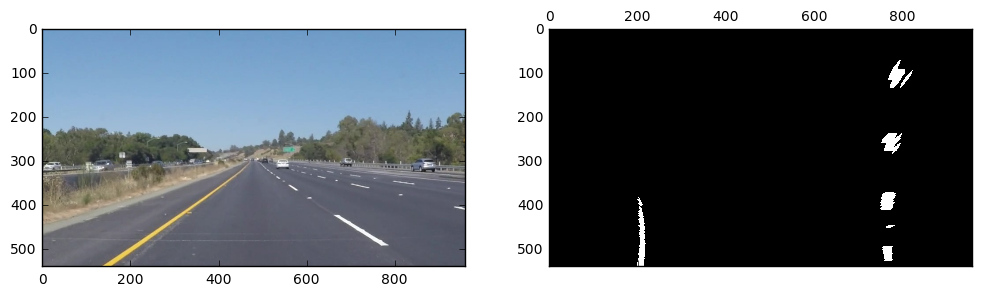

test_images/test1.jpg


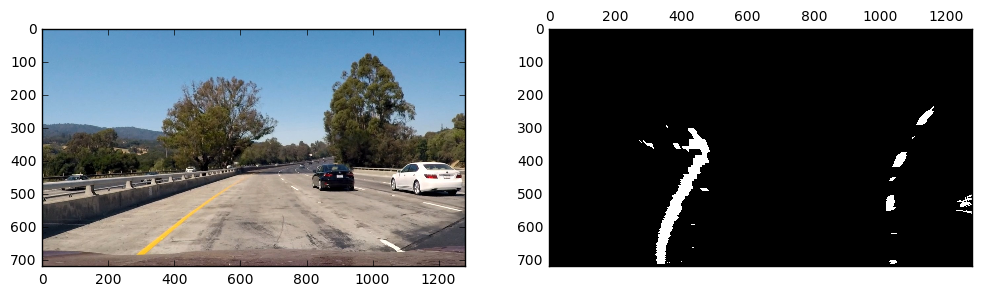

test_images/test2.jpg


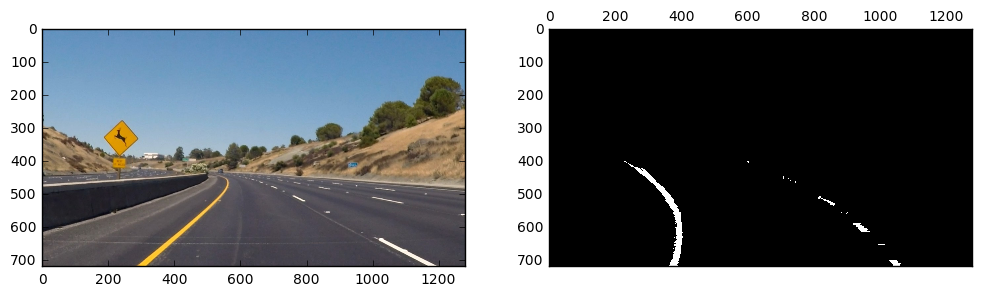

test_images/test3.jpg


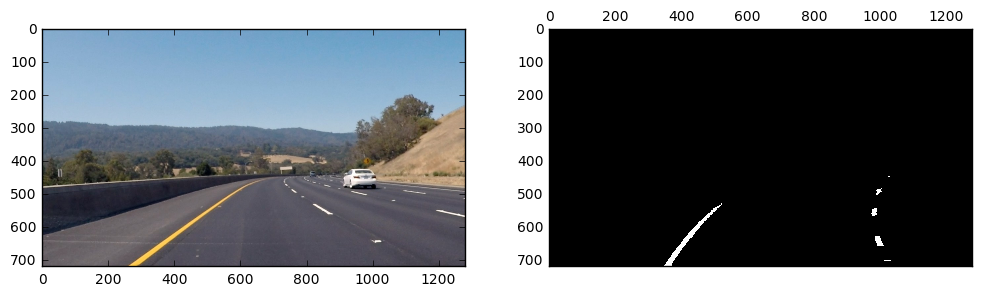

test_images/test4.jpg


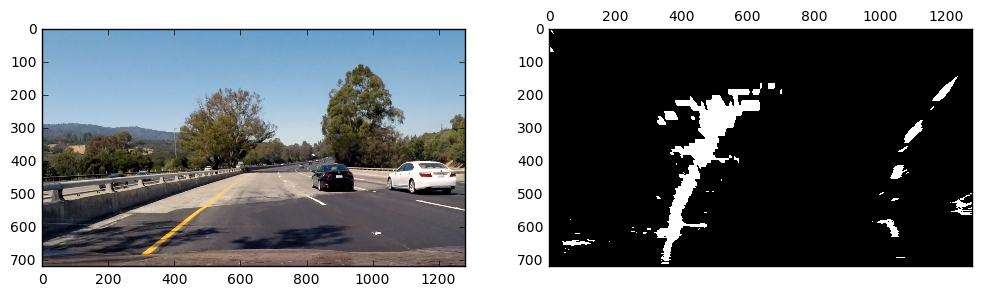

test_images/test5.jpg


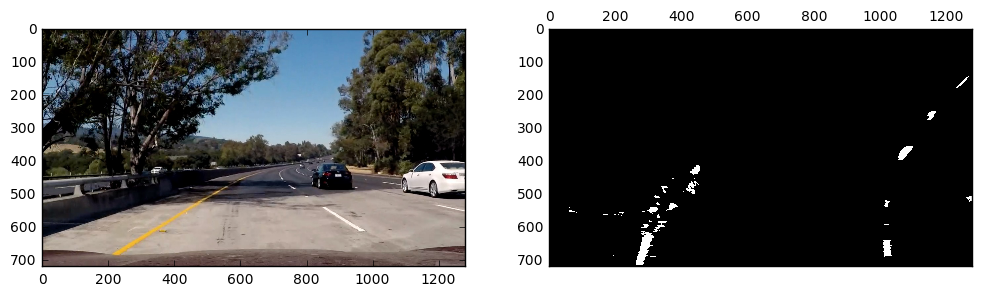

test_images/test6.jpg


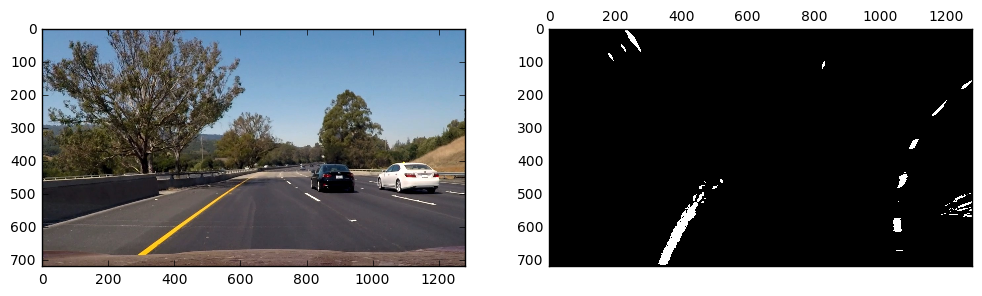

In [13]:
def display_topdown():
    for path in find_images('test_images/*.jpg'):
        print(path)
        image = load_image(path)
        mapped = binary_map(image)
        (Mf, Mi) = perspective_matrices(Size(image))
        topdown = transform_image(mapped, Mf)
        with Displayer(1, 2) as display:
            display(0, 0, image)
            display(0, 1, topdown)


display_topdown()

---

## 5. Lane Line Point Extraction

Pixels corresponding to lane line can be identified by computing a density distribution for the bottom half of the map, finding the two modes (local maxima) corresponding to the lane lines, and extending from there using windowed search. The identified pixels can then be extracted as 2D points:

In [14]:
from scipy.signal import argrelextrema
from scipy.stats import gaussian_kde


class Points(object):
    def __init__(self, k, window):
        (m, n) = window.data.shape
        (w, h) = (window.w, window.h)
        w_2 = w // 2

        windows = []
        X = [np.int32([])]
        Y = [np.int32([])]
        
        for i in range(m - h, h - 1, -h):
            a = min(max(0, k - w), n - 2 * w)
            b = a + w
            counts = [window.sum(i, j) for j in range(a, b)]
            j = np.argmax(counts)
            if counts[j] == 0:
                break

            k = a + j
            (Xi, Yi) = window.points(i, k)
            X.append(Xi)
            Y.append(Yi)
            k += w_2 # Centers k on the window for the next iteration
            
            windows.append(k)
        
        self.windows = windows if len(windows) > 0 else [k]
        self.windows_shape = (h, w)
        self.X = np.concatenate(X)
        self.Y = np.concatenate(Y)

    def __len__(self):
        return len(self.X)
    

class Window(object):
    def __init__(self, data):
        (m, n) = data.shape
        (w, h) = params.perspectives.topdown.window
        (w, h) = (int(w * n), int(h * m))

        self.w = w
        self.h = h
        self.data = data
        self.integral = cv2.integral(data)
    
    def sum(self, i, j):
        m = i + self.h
        n = j + self.w
        data = self.integral
        return data[i, j] + data[m, n] - data[i, n] - data[m, j]

    def points(self, i, j):
        m = i + self.h
        n = j + self.w
        data = self.data[i:m, j:n]
        (Y, X) = np.indices(data.shape)
        k = (data > 0)
        return (
            X[k].ravel() + j,
            Y[k].ravel() + i
        )


class PointExtractor(object):
    def __init__(self):
        self.__lines = None

    def __call__(self, data):
        (l, r) = self.__extract(data)
        if len(l) != 0 and len(r) != 0:
            return (l, r)

        # If point extraction fails, reset locator and try again.
        self.__lines = None
        return self.__extract(data)

    def __extract(self, data):
        (kl, kr) = self.__locate(data)
        window = Window(data)
        l = Points(kl, window)
        r = Points(kr, window)
        self.__lines = (l.windows[0], r.windows[0])
        return (l, r)
    
    def __locate(self, data):
        if self.__lines is None:
            # Compute point density across the bottom half of the map.
            (m, n) = data.shape
            (y, x) = np.indices(data.shape)
            bottom = (data > 0) & (y > m // 2)
            points = x[bottom].ravel()
            pdf = gaussian_kde(points)
            density = pdf(np.arange(n))

            # Locate the modes (local maxima) of the distribution
            (modes,) = argrelextrema(density, np.greater)

            # Locate the two highest modes
            modes = sorted(modes, key=lambda i: -density[i])
            modes = modes[:2]
            modes.sort() # Re-sort to get mode positions in increasing order
            self.__lines = modes
        
        return self.__lines

The code below shows the results of point extraction applied to lane binary maps:

test_images/solidWhiteRight.jpg


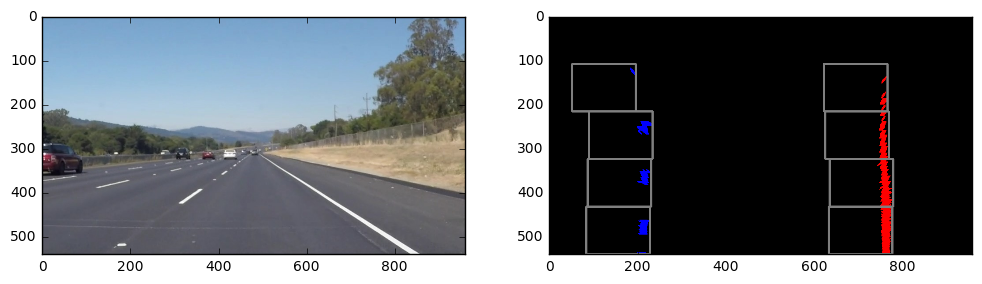

test_images/solidYellowLeft.jpg


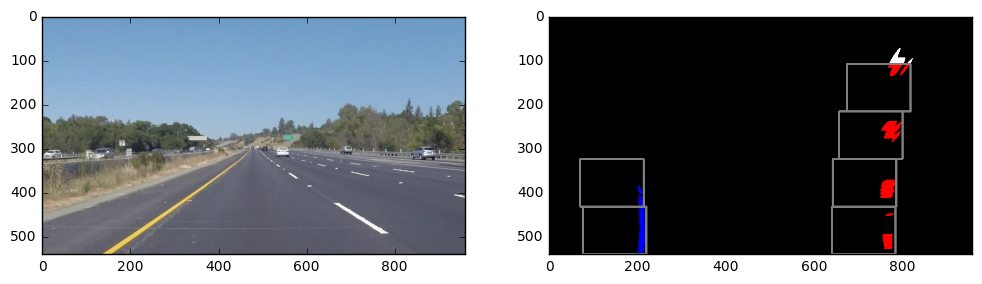

test_images/test1.jpg


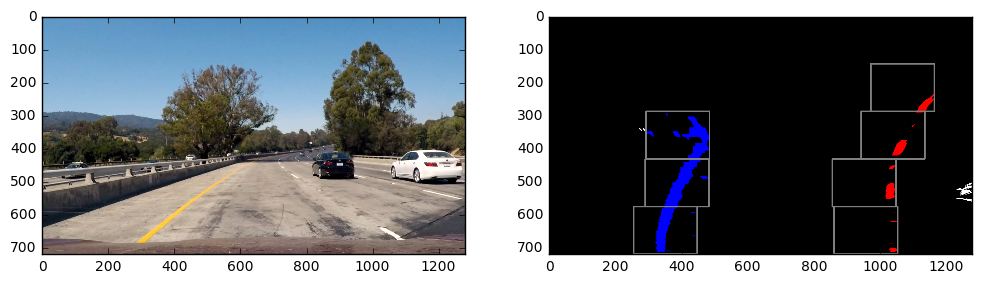

test_images/test2.jpg


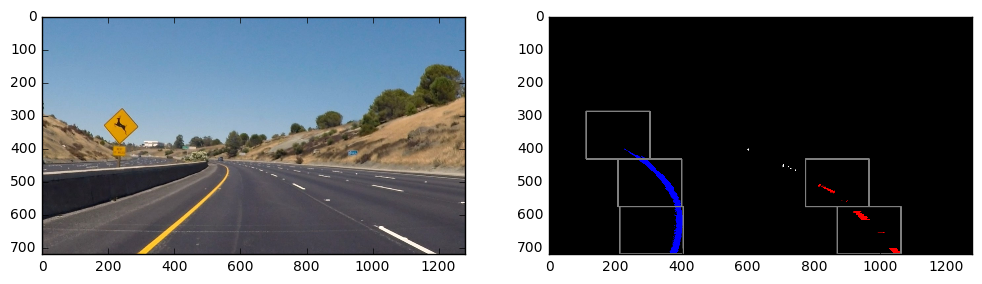

test_images/test3.jpg


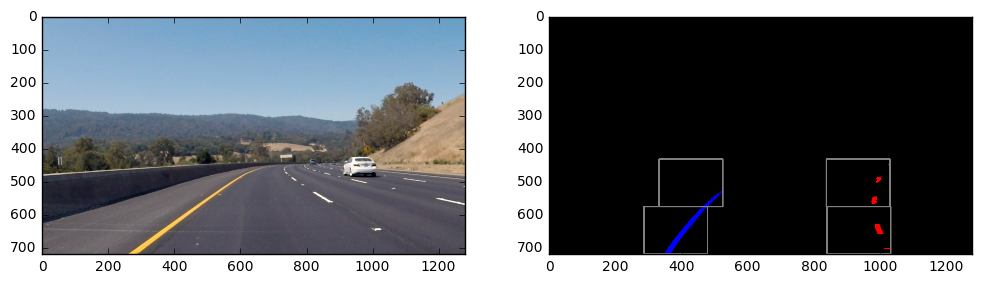

test_images/test4.jpg


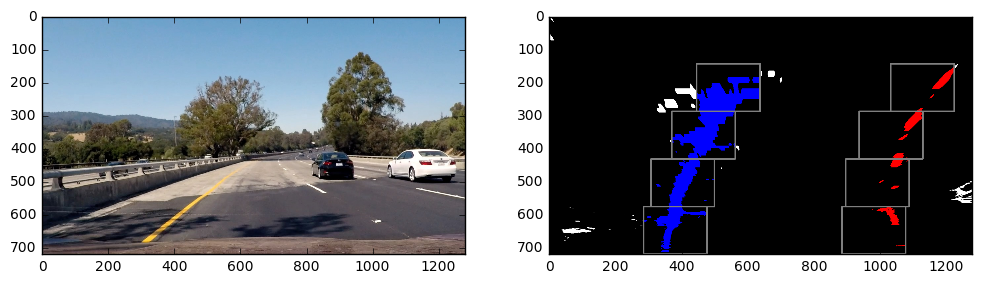

test_images/test5.jpg


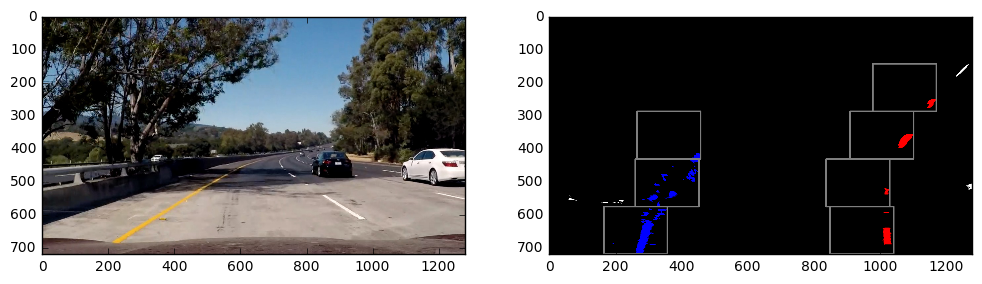

test_images/test6.jpg


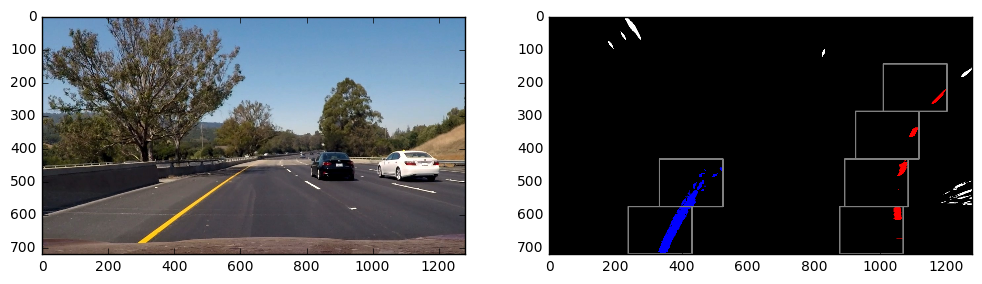

In [15]:
def mark_lane_line(bgr, points, color):
    if len(points) == 0:
        return

    bgr[points.Y, points.X] = color

    (m, n) = bgr.shape[:2]
    (h, w) = points.windows_shape
    w_2 = w // 2
    for (y1, k) in zip(range(m - h, -1, -h), points.windows):
        x1 = k - w_2
        x2 = k + w_2
        y2 = y1 + h
        cv2.rectangle(bgr, (x1, y1), (x2, y2), (127, 127, 127), 3)
    

def mark_lane_lines(data, points):
    c = data.astype(np.uint8) * 255
    bgr = np.dstack([c, c, c])
    
    (l, r) = points
    mark_lane_line(bgr, l, BGR_BLUE)
    mark_lane_line(bgr, r, BGR_RED)
    
    return bgr


def display_lanes():
    for path in find_images('test_images/*.jpg'):
        print(path)
        image = load_image(path)
        mapped = binary_map(image)
        (Mf, Mi) = perspective_matrices(Size(image))
        topdown = transform_image(mapped, Mf)

        extract = PointExtractor()
        points = extract(topdown)
        marked = mark_lane_lines(topdown, points)
        
        with Displayer(1, 2) as display:
            display(0, 0, image)
            display(0, 1, marked)


display_lanes()

---

## 6. Lane boundary Estimation and Attribute Computation

Linear regression can be applied to top-down binary maps to estimate lane curves. First points are extracted from the transform binary map, then split in two lists (corresponding to left and right lanes) and finally fed into linear regressors for parameter estimation.

In [16]:
from sklearn.linear_model import RANSACRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline


class Curve(object):
    def __init__(self, X, Y, yn):
        features = PolynomialFeatures(2)
        regressor = RANSACRegressor()
        model = make_pipeline(features, regressor)
        model.fit(np.array([Y]).T, np.array([X]).T)
        curve = regressor.estimator_
        bias = curve.intercept_[0]
        self.coef = np.array(curve.coef_.flat)
        self.coef[0] = bias
        self.yn = yn
        self.__center = None
        self.__points = None

    def __call__(self, x):
        (a, b, c) = self.coef
        return a + b * x + c * x ** 2.0

    def __iadd__(self, other):
        l = params.estimates.decay
        self.coef = l * self.coef + (1.0 - l) * other.coef
        
        # Reset cached computed values
        self.__center = None
        self.__points = None
        
        return self
        
    @property
    def center(self):
        if self.__center is None:
            (X, Y) = self.points.T
            self.__center = (np.mean(X), np.mean(Y))

        return self.__center

    @property
    def points(self):
        if self.__points is None:
            Y = np.arange(self.yn, dtype=np.float32)
            X = self(Y)
            self.__points = np.float32([X, Y]).T
            self.__points.flags.writeable = False

        return self.__points


class LaneLine(object):
    def __init__(self, X, Y, yn):
        (x_world, y_world) = params.world.scale
        X_world = X * x_world
        Y_world = Y * y_world

        self.image = Curve(X, Y, yn)
        self.world = Curve(X_world, Y_world, yn * y_world)

    def __iadd__(self, other):
        if other is not None:
            self.image += other.image
            self.world += other.world

        return self

    @property
    def curvature(self):
        x = self.world.yn
        (a, b, c) = self.world.coef
        return ((1 + (2 * c * x + b) ** 2) ** 1.5) / abs(2 * c)
    

class Lane(object):
    def __init__(self, shape, points):
        self.center = 0.5 * shape[1]
        
        (l, r) = points
        if len(l) == 0 or len(r) == 0:
            self.L = None
            self.R = None
            return

        yn = shape[0]
        self.L = self.__line(l.X, l.Y, yn)
        self.R = self.__line(r.X, r.Y, yn)

    def __line(self, X, Y, yn):
        try:
            return LaneLine(X, Y, yn)
        except ValueError as e:
            return None

    def __iadd__(self, other):
        self.L += other.L
        self.R += other.R
        return self
    
    @property
    def offcenter(self):
        x_L = self.L.world.points[-1, 0]
        x_R = self.R.world.points[-1, 0]
        x_C = params.world.scale[0] * self.center
        return x_C - 0.5 * (x_L + x_R)

The code below shows the results of applying curve regression to top-down binary maps:

test_images/solidWhiteRight.jpg

Curvature Radius (L): 334.437 m
Curvature Radius (R): 2495.955 m
Riding 0.014m to the left of lane center


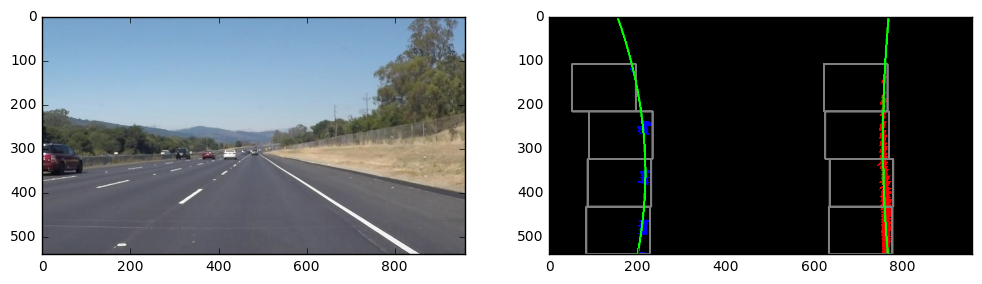

test_images/solidYellowLeft.jpg

Curvature Radius (L): 145.735 m
Curvature Radius (R): 12565.154 m
Riding 0.036m to the left of lane center


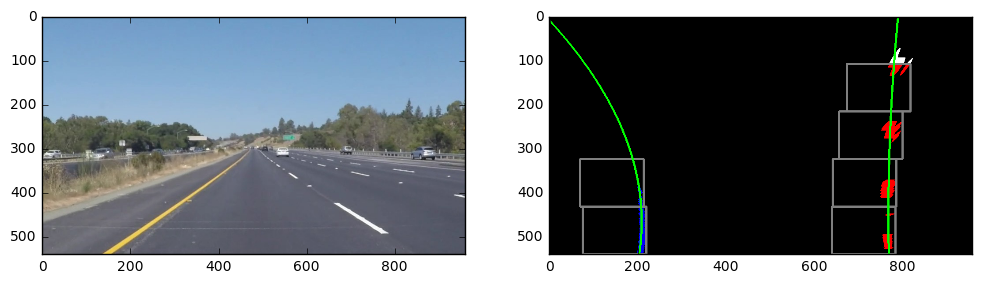

test_images/test1.jpg

Curvature Radius (L): 486.810 m
Curvature Radius (R): 106.966 m
Riding 0.138m to the left of lane center


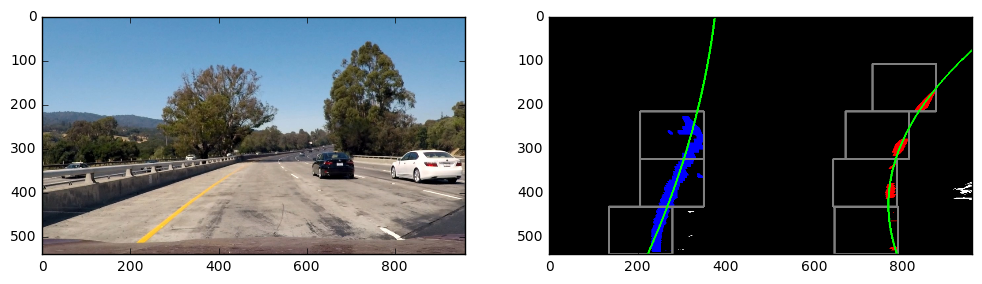

test_images/test2.jpg

Curvature Radius (L): 38.118 m
Curvature Radius (R): 85.693 m
Riding 0.255m to the left of lane center


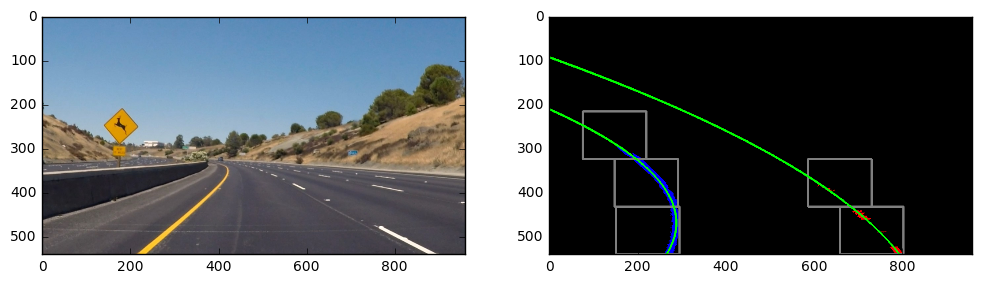

test_images/test3.jpg

Curvature Radius (L): 122.751 m
Curvature Radius (R): 45.405 m
Riding 0.214m to the left of lane center


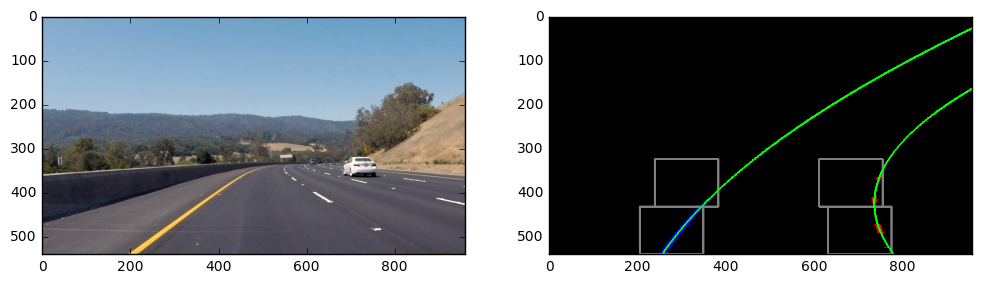

test_images/test4.jpg

Curvature Radius (L): 158.786 m
Curvature Radius (R): 102.140 m
Riding 0.264m to the left of lane center


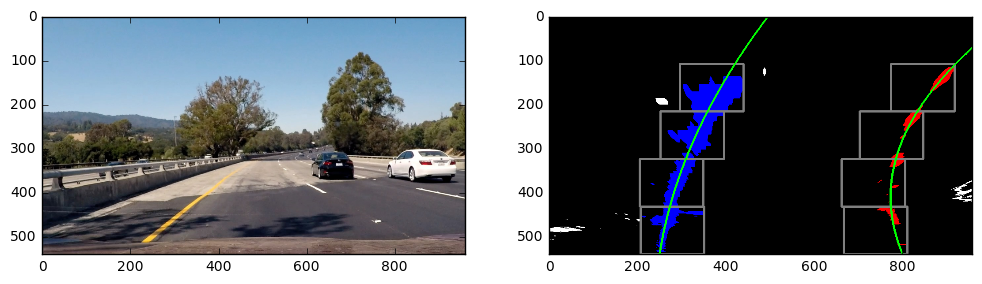

test_images/test5.jpg

Curvature Radius (L): 68.559 m
Curvature Radius (R): 97.175 m
Riding 0.008m to the left of lane center


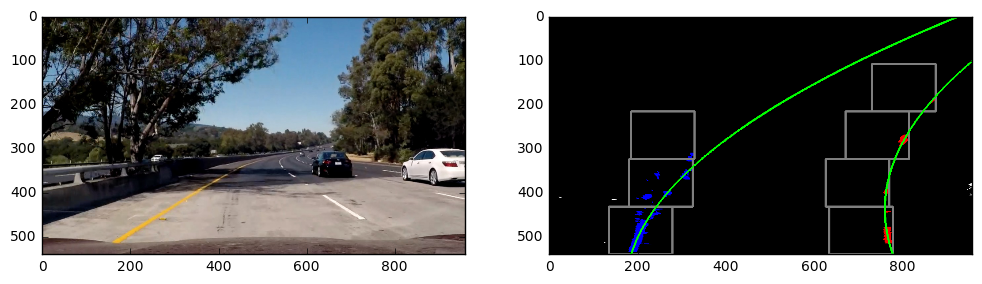

test_images/test6.jpg

Curvature Radius (L): 330.146 m
Curvature Radius (R): 168.246 m
Riding 0.223m to the left of lane center


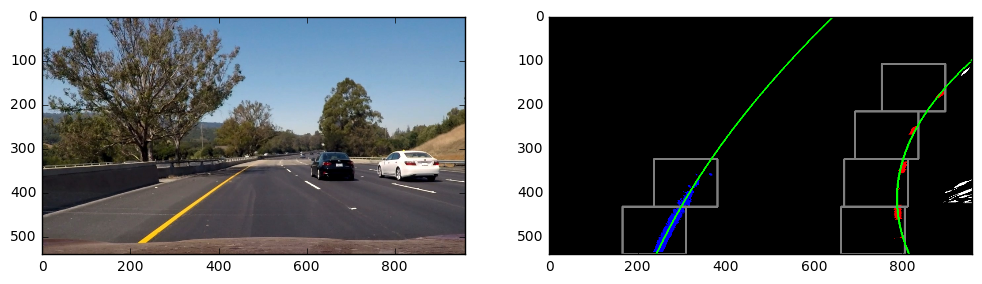

In [17]:
class LaneDetector(object):
    def __init__(self, size):
        self.Mf = perspective_matrices(size)[0]
        self.extractor = PointExtractor()
        
    def __call__(self, bgr):
        (lane, topdown) = self.detect(bgr)
        return topdown
        
    def detect(self, bgr):
        binmap = binary_map(bgr)
        topdown = transform_image(binmap, self.Mf)
        points = self.__points(topdown)
        lane = Lane(topdown.shape, points)

        topdown = mark_lane_lines(topdown, points)
        
        if lane.L is not None:
            draw_lines(topdown, lane.L.image.points, BGR_GREEN, 3)
            
        if lane.R is not None:
            draw_lines(topdown, lane.R.image.points, BGR_GREEN, 3)

        return (lane, topdown)

    def __points(self, data):
        try:
            extractor = self.extractor
            return extractor(data)
        except ValueError as e:
            return ([], [])


def display_curves():
    paths = find_images('test_images/*.jpg')
    size = Size(load_image(paths[0]))
    detector = LaneDetector(size)
    for path in paths:
        print(path)
        image = load_image(path, size)
        (lane, topdown) = detector.detect(image)
        
        print('\nCurvature Radius (L): %.3f m' % lane.L.curvature)
        print('Curvature Radius (R): %.3f m' % lane.R.curvature)
        
        offcenter = lane.offcenter
        if offcenter == 0:
            print('Riding on lane center')
        else:
            direction = 'left' if offcenter < 0 else 'right'
            print('Riding %.3fm to the %s of lane center' % (abs(offcenter), direction))
            
        
        with Displayer(1, 2) as display:
            display(0, 0, image)
            display(0, 1, topdown)


display_curves()

---

## 7. Lane Annotation on Original Image

Estimated lane curves are finally transformed back into front perspective and drawn into the original image:

In [18]:
def annotate_lanes(bgr, lane, Mi):
    annotated = np.copy(bgr)
    L_front = transform_points(lane.L.image.points, Mi)
    R_front = transform_points(lane.R.image.points, Mi)
    draw_lines(annotated, L_front, BGR_GREEN, 3)
    draw_lines(annotated, R_front, BGR_GREEN, 3)
    return annotated

The code below demonstrates the use of the function above to annotate input images:

test_images/solidWhiteRight.jpg

Curvature Radius (L): 280.369 m
Curvature Radius (R): 1476.100 m
Riding 0.019m to the left of lane center


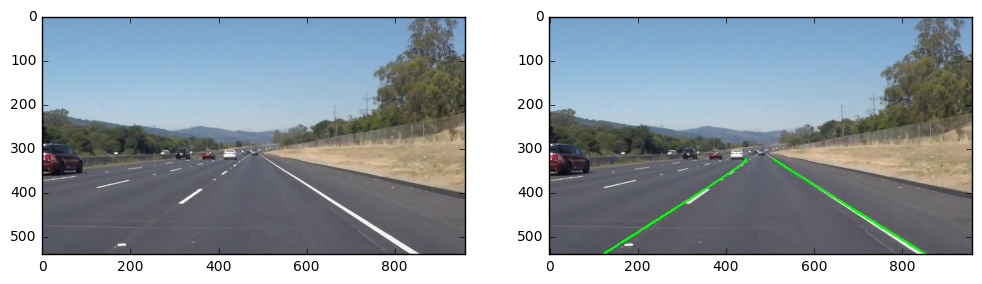

test_images/solidYellowLeft.jpg

Curvature Radius (L): 308.826 m
Curvature Radius (R): 1320.512 m
Riding 0.034m to the left of lane center


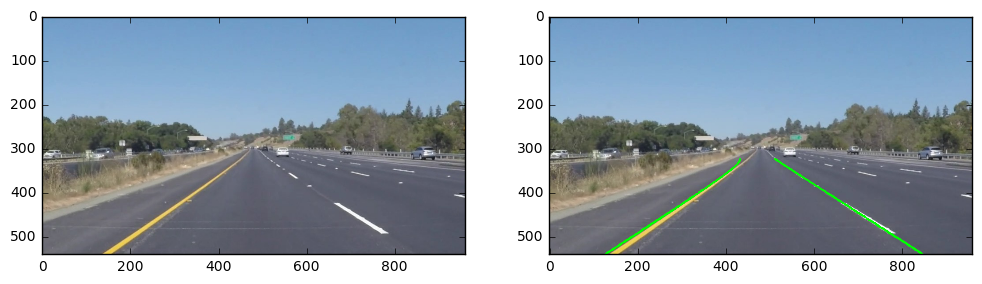

test_images/test1.jpg

Curvature Radius (L): 292.984 m
Curvature Radius (R): 90.262 m
Riding 0.170m to the left of lane center


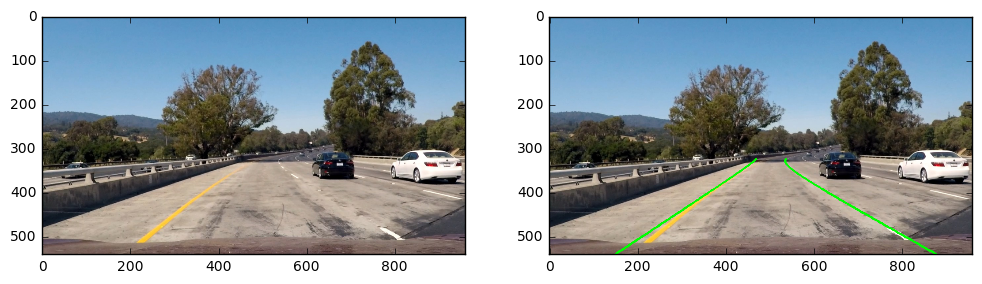

test_images/test2.jpg

Curvature Radius (L): 38.601 m
Curvature Radius (R): 77.781 m
Riding 0.257m to the left of lane center


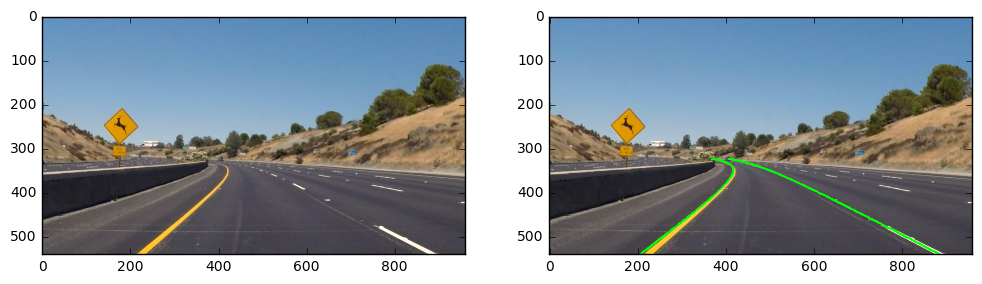

test_images/test3.jpg

Curvature Radius (L): 122.751 m
Curvature Radius (R): 43.461 m
Riding 0.212m to the left of lane center


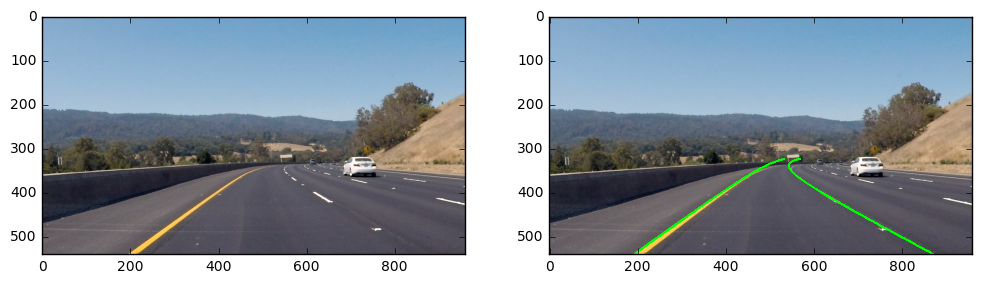

test_images/test4.jpg

Curvature Radius (L): 222.881 m
Curvature Radius (R): 101.769 m
Riding 0.242m to the left of lane center


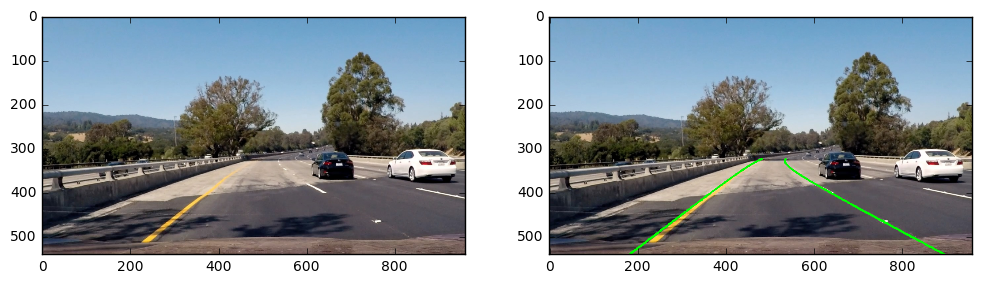

test_images/test5.jpg

Curvature Radius (L): 67.473 m
Curvature Radius (R): 93.018 m
Riding 0.014m to the left of lane center


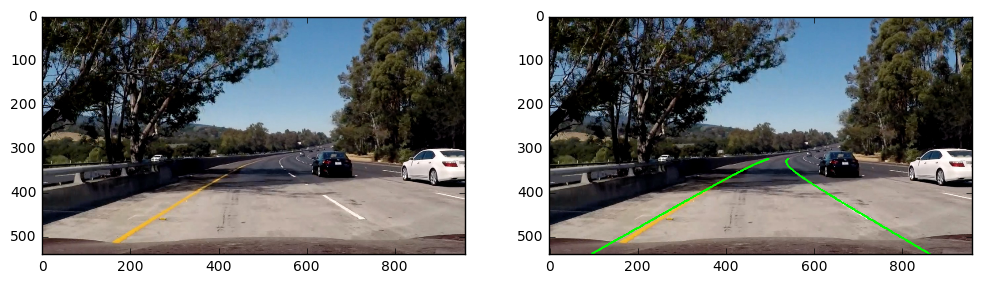

test_images/test6.jpg

Curvature Radius (L): 223.347 m
Curvature Radius (R): 97.872 m
Riding 0.262m to the left of lane center


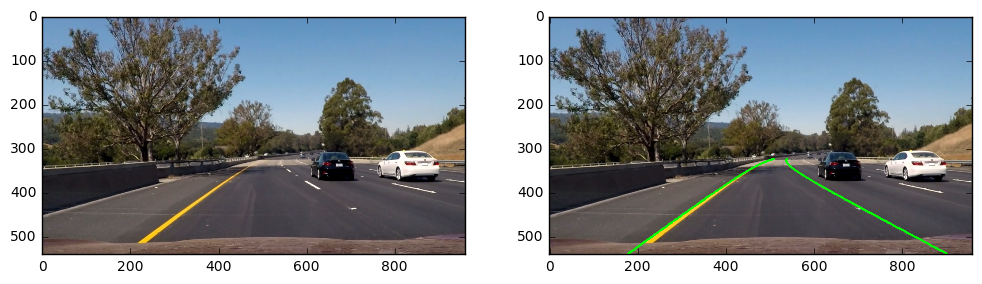

In [19]:
def display_annotated():
    paths = find_images('test_images/*.jpg')
    size = Size(load_image(paths[0]))
    Mi = perspective_matrices(size)[1]
    detector = LaneDetector(size)
    for path in paths:
        print(path)
        image = load_image(path, size)
        (lane, topdown) = detector.detect(image)
        annotated = annotate_lanes(image, lane, Mi)
        
        print('\nCurvature Radius (L): %.3f m' % lane.L.curvature)
        print('Curvature Radius (R): %.3f m' % lane.R.curvature)
        
        offcenter = lane.offcenter
        if offcenter == 0:
            print('Riding on lane center')
        else:
            direction = 'left' if offcenter < 0 else 'right'
            print('Riding %.3fm to the %s of lane center' % (abs(offcenter), direction))
            
        
        with Displayer(1, 2) as display:
            display(0, 0, image)
            display(0, 1, annotated)


display_annotated()

---

## 8. Print Lane Curvature Radius and Car Displacement on Original Image

Additionally, the calculated radius of curvature and viewer displacement relative to lane boundaries must be printed onto annotated images. This is done by the code below, which also keeps a running estimate of lane boundary position in order to make outputs more robust:

In [20]:
class PipeAdLR(object):
    def __init__(self, size):
        self.extractor = PointExtractor()
        (self.Mf, self.Mi) = perspective_matrices(size)
        self.lane = None

    def __call__(self, bgr):
        topdown = transform_image(binary_map(bgr), self.Mf)
        lane = Lane(topdown.shape, self.__points(topdown))
        if self.lane is None:
            self.lane = lane
        else:
            self.lane += lane

        text_L = 'Curvature Radius (L): %.3f m' % self.lane.L.curvature
        text_R = 'Curvature Radius (R): %.3f m' % self.lane.R.curvature

        text_C = 'Riding on lane center'
        offcenter = self.lane.offcenter
        if offcenter != 0:
            direction = 'left' if offcenter < 0 else 'right'
            text_C = 'Riding %.3fm to the %s of lane center' % (abs(offcenter), direction)

        bgr = annotate_lanes(bgr, self.lane, self.Mi)
        cv2.putText(bgr, text_L, (20, 50), cv2.FONT_HERSHEY_PLAIN, 1, BGR_GREEN)
        cv2.putText(bgr, text_R, (20, 80), cv2.FONT_HERSHEY_PLAIN, 1, BGR_GREEN)
        cv2.putText(bgr, text_C, (20, 110), cv2.FONT_HERSHEY_PLAIN, 1, BGR_GREEN)
        
        return bgr

    def __points(self, data):
        try:
            extractor = self.extractor
            return extractor(data)
        except ValueError as e:
            return ([], [])

We can test it on sample images to verify it works as desired:

test_images/solidWhiteRight.jpg


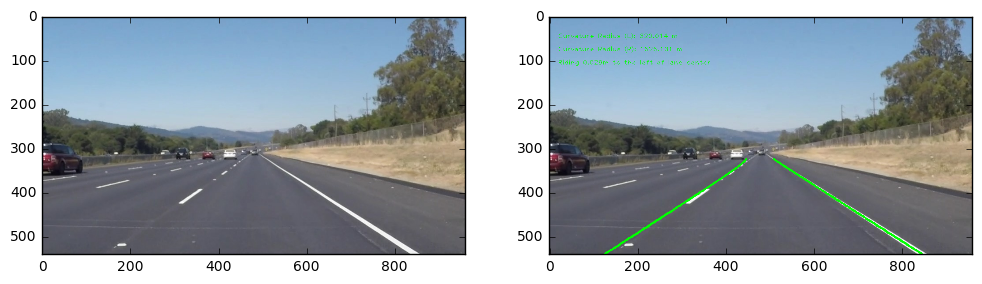

test_images/solidYellowLeft.jpg


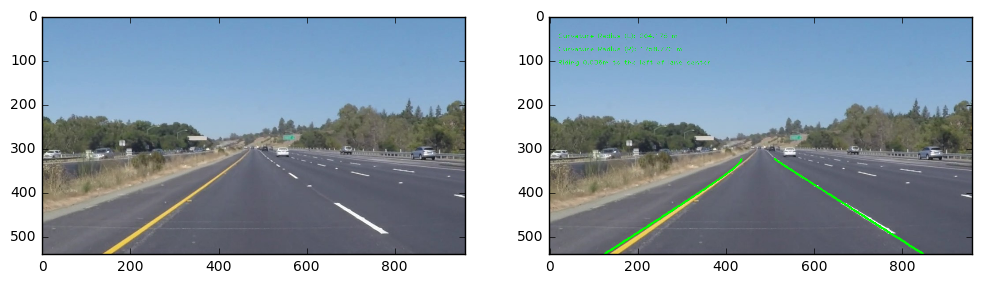

test_images/test1.jpg


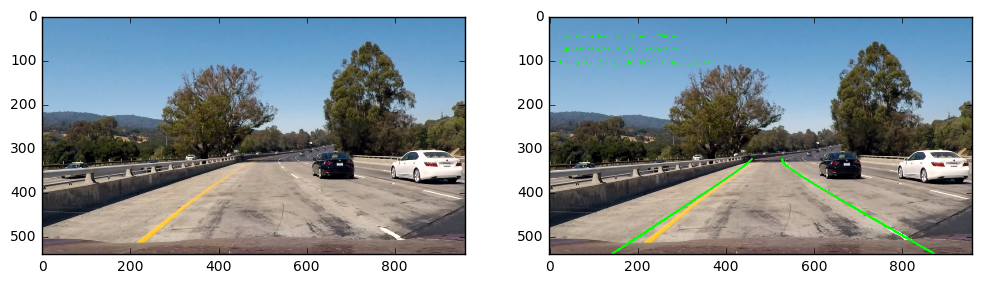

test_images/test2.jpg


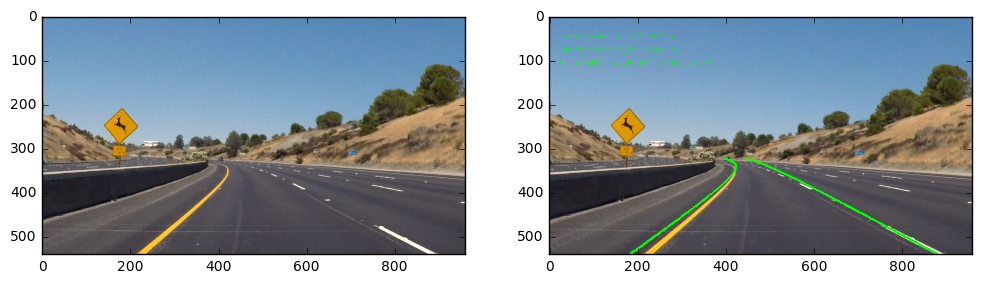

test_images/test3.jpg


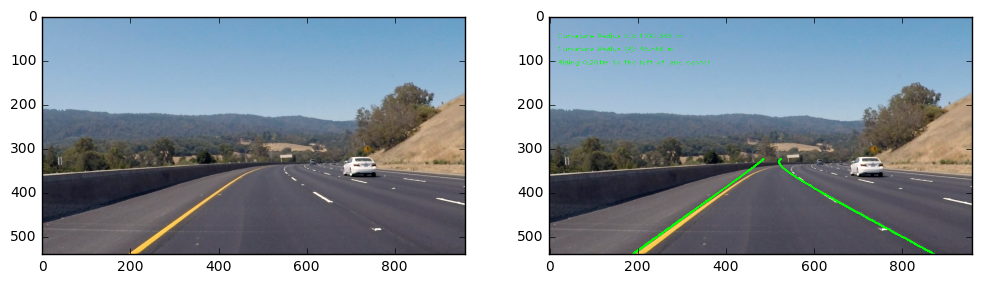

test_images/test4.jpg


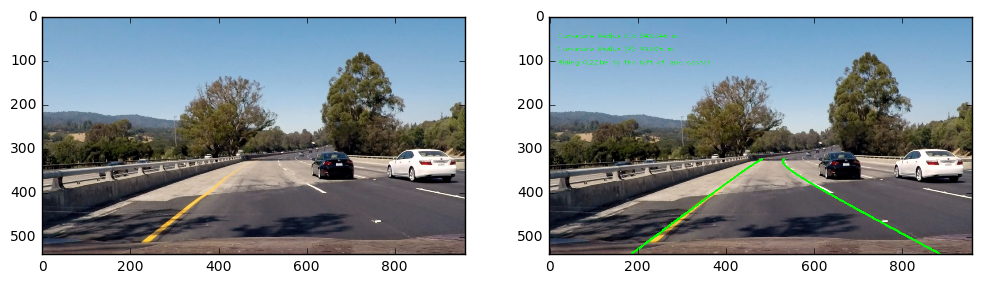

test_images/test5.jpg


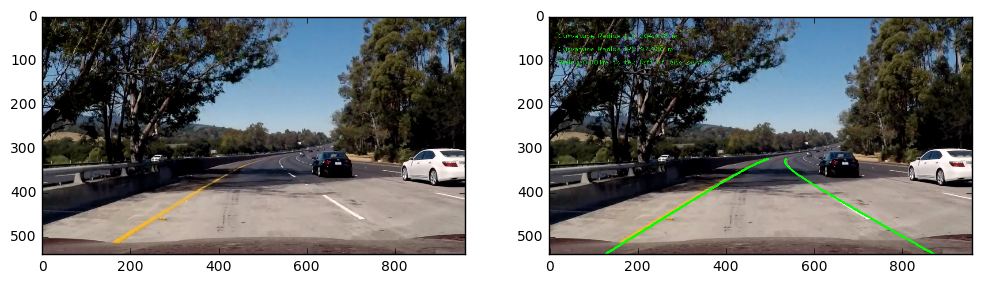

test_images/test6.jpg


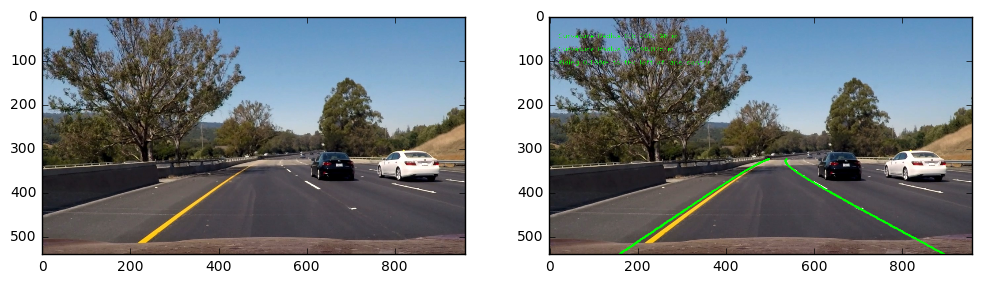

In [21]:
def display_pipelined():
    paths = find_images('test_images/*.jpg')
    size = Size(load_image(paths[0]))
    pipeline = PipeAdLR(size)
    for path in paths:
        print(path)
        image = load_image(path, size)
        for i in range(0, 10):
            piped = pipeline(image)

        with Displayer(1, 2) as display:
            display(0, 0, image)
            display(0, 1, piped)


display_pipelined()

---

## 9. Experiments

Before starting tests, let's define a few conveniences for processing and diplaying videos:

In [22]:
from os.path import splitext
from time import time
from moviepy.editor import VideoFileClip
from IPython.display import HTML


# Template HTML snippet for embedding a video display into the notebook.
class VideoTag(object):
    def __mod__(self, path):
        return r'<video width="960" height="540" controls><source src="%s?t=%d"></video>' % (path, time())

VIDEO_TAG = VideoTag()


def BGR(processor):
    def converter(image):
        bgr = image[:, :, ::-1] # Convert image to BGR
        image = processor(bgr)
        return image[:, :, ::-1] # Convert image back to RGB
    
    return converter


def process_video(video, processor, path):
    r'''Process the video at the input path, saving the result to the output video file path.
    '''
    edited = video.fl_image(BGR(processor))
    # Display processing progress inline.
    %time edited.write_videofile(path, audio=False)
    
    
def process(path):
    video = VideoFileClip(path)
    (name, ext) = splitext(path)
    process_video(video, binary_image, name + '_binary_map' + ext)
    process_video(video, LaneDetector(video.size), name + '_lane_regression' + ext)
    process_video(video, PipeAdLR(video.size), name + '_annotated' + ext)

Now with all pieces in place, let's start by testing the regressor on the first example video:

In [23]:
process('project_video.mp4')

[MoviePy] >>>> Building video project_video_binary_map.mp4
[MoviePy] Writing video project_video_binary_map.mp4


100%|█████████▉| 1260/1261 [03:07<00:00,  7.52it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_binary_map.mp4 

CPU times: user 22min 14s, sys: 51.4 s, total: 23min 5s
Wall time: 3min 8s
[MoviePy] >>>> Building video project_video_lane_regression.mp4
[MoviePy] Writing video project_video_lane_regression.mp4


100%|█████████▉| 1260/1261 [04:23<00:00,  5.47it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_lane_regression.mp4 

CPU times: user 30min 49s, sys: 1min 12s, total: 32min 1s
Wall time: 4min 23s
[MoviePy] >>>> Building video project_video_annotated.mp4
[MoviePy] Writing video project_video_annotated.mp4


100%|█████████▉| 1260/1261 [04:50<00:00,  4.13it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_annotated.mp4 

CPU times: user 32min 23s, sys: 1min 19s, total: 33min 43s
Wall time: 4min 51s


Results can be visualized inline using the snippet below:

In [24]:
HTML(VIDEO_TAG % 'project_video_binary_map.mp4')

In [25]:
HTML(VIDEO_TAG % 'project_video_lane_regression.mp4')

In [26]:
HTML(VIDEO_TAG % 'project_video_annotated.mp4')

Now for the first challenge video:

In [27]:
process('challenge_video.mp4')

[MoviePy] >>>> Building video challenge_video_binary_map.mp4
[MoviePy] Writing video challenge_video_binary_map.mp4


100%|██████████| 485/485 [01:15<00:00,  7.24it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_binary_map.mp4 

CPU times: user 8min 41s, sys: 21.3 s, total: 9min 3s
Wall time: 1min 16s
[MoviePy] >>>> Building video challenge_video_lane_regression.mp4
[MoviePy] Writing video challenge_video_lane_regression.mp4


100%|██████████| 485/485 [02:11<00:00,  3.02it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_lane_regression.mp4 

CPU times: user 15min 3s, sys: 35.1 s, total: 15min 38s
Wall time: 2min 12s
[MoviePy] >>>> Building video challenge_video_annotated.mp4
[MoviePy] Writing video challenge_video_annotated.mp4


100%|██████████| 485/485 [02:18<00:00,  3.33it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_annotated.mp4 

CPU times: user 15min 18s, sys: 36 s, total: 15min 54s
Wall time: 2min 18s


In [28]:
HTML(VIDEO_TAG % 'challenge_video_binary_map.mp4')

In [29]:
HTML(VIDEO_TAG % 'challenge_video_lane_regression.mp4')

In [30]:
HTML(VIDEO_TAG % 'challenge_video_annotated.mp4')

And last for the second challenge video:

In [31]:
process('harder_challenge_video.mp4')

[MoviePy] >>>> Building video harder_challenge_video_binary_map.mp4
[MoviePy] Writing video harder_challenge_video_binary_map.mp4


100%|█████████▉| 1199/1200 [03:19<00:00,  7.03it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_binary_map.mp4 

CPU times: user 22min 1s, sys: 55.2 s, total: 22min 56s
Wall time: 3min 20s
[MoviePy] >>>> Building video harder_challenge_video_lane_regression.mp4
[MoviePy] Writing video harder_challenge_video_lane_regression.mp4


100%|█████████▉| 1199/1200 [08:05<00:00,  2.25it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_lane_regression.mp4 

CPU times: user 51min 8s, sys: 1min 56s, total: 53min 4s
Wall time: 8min 5s
[MoviePy] >>>> Building video harder_challenge_video_annotated.mp4
[MoviePy] Writing video harder_challenge_video_annotated.mp4


100%|█████████▉| 1199/1200 [08:40<00:00,  2.45it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_annotated.mp4 

CPU times: user 52min 10s, sys: 2min 5s, total: 54min 15s
Wall time: 8min 41s


In [32]:
HTML(VIDEO_TAG % 'harder_challenge_video_binary_map.mp4')

In [33]:
HTML(VIDEO_TAG % 'harder_challenge_video_lane_regression.mp4')

In [34]:
HTML(VIDEO_TAG % 'harder_challenge_video_annotated.mp4')